In [233]:
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import shap
import catboost as cb
import xgboost as xgb

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import roc_auc_score, mean_absolute_error
from treeinterpreter import treeinterpreter as ti
from tqdm import tqdm

shap.initjs()
warnings.simplefilter("ignore")
pd.set_option("display.max_columns", 100)

## Данные с соревнования Home Credit Default Risk

https://www.kaggle.com/c/home-credit-default-risk - задача прогнозирования дефолта клиента

In [3]:
train = pd.read_csv(
    "../../other_ml/data/home-credit-default-risk/application_train.csv")

y = train["TARGET"]
X = train.select_dtypes(include=[float])

In [4]:
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, train_size=0.7, random_state=1
)
print("train.shape: {} rows, {} cols".format(*X_train.shape))
print("valid.shape: {} rows, {} cols".format(*X_valid.shape))

X_valid = X_valid.reset_index(drop=True)
y_valid = y_valid.reset_index(drop=True)

train.shape: 215257 rows, 65 cols
valid.shape: 92254 rows, 65 cols


In [235]:
X_valid.head(n=2)

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,OWN_CAR_AGE,CNT_FAM_MEMBERS,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,135000.0,654498.0,31617.0,585000.0,0.005313,-8985.0,NaN,2.0,NaN,0.622652,0.602386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1237.0,0.0,0.0,0.0,0.0,0.0,3.0
1,135000.0,234576.0,25393.5,202500.0,0.010643,-1909.0,13.0,1.0,NaN,0.655960,0.492060,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,1.0,0.0,-379.0,0.0,0.0,1.0,0.0,0.0,0.0


## Данные с соревнования Two Sigma Connect: Rental Listing Inquiries

https://www.kaggle.com/c/two-sigma-connect-rental-listing-inquiries - задача прогнозирования арендной стоимости недвижимости в Нью-Йорке

In [74]:
rent_data = pd.read_json("../../other_ml/data/train.json")
X_rent = rent_data[[
    "bathrooms",
    "bedrooms",
    "longitude",
    "latitude",
]]

y_rent = rent_data["price"]

# добавим столбец с шумом
X_rent["random"] = np.random.random(X_rent.shape[0])

In [75]:
X_rent_train, X_rent_valid, y_rent_train, y_rent_valid = train_test_split(
    X_rent, y_rent, train_size=0.7, random_state=1
)
print("train.shape: {} rows, {} cols".format(*X_rent_train.shape))
print("valid.shape: {} rows, {} cols".format(*X_rent_valid.shape))

X_rent_valid = X_rent_valid.reset_index(drop=True)
y_rent_valid = y_rent_valid.reset_index(drop=True)

train.shape: 34546 rows, 5 cols
valid.shape: 14806 rows, 5 cols


In [231]:
X_rent_valid.head(n=2)

,bathrooms,bedrooms,longitude,latitude,random
0,1.0,1,-73.9982,40.7568,0.985417
1,1.5,2,-73.9935,40.7301,0.317983


## Случайный лес

In [76]:
params = {
    "n_estimators": 100,
    "max_depth": 7,
    "random_state": 27,
    "n_jobs": 6
}

rf_model = RandomForestClassifier(**params)
rf_model.fit(X_train.fillna(-9999), y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=7, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=6,
                       oob_score=False, random_state=27, verbose=0,
                       warm_start=False)

In [77]:
rg_params = {
    "n_estimators": 100,
    "min_samples_leaf": 1,
    "n_jobs": 6
}

rent_model_regressor = RandomForestRegressor(**rg_params)
rent_model_regressor.fit(X_rent, y_rent)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=6,
                      oob_score=False, random_state=None, verbose=0,
                      warm_start=False)

## Знакомство с важностями признаков

* мы построили хорошую по качеству модели и это уже здорово :)
* мы хотим детальнее интерпретировать построенную модель.

__Пример:__ мы построили модель кредитного скоринга, и хотим понимать по какой причине модель одобряет / отказывает заявки на кредит, поданные клиентами, кроме того мы сможем понять какой профиль у клиентов, которые подают заявки на определенный продукт.

## Встроенная оценка важности в RandomForest

__Эвристика:__ усредненное уменьшение неоднородности (Джини / Энтропия для задачи классификация, дисперсия - для задачи регрессии)

__Плюсы__:
* очень легко построить;
* есть в любой реализации случайного леса;

__Минусы:__
* имеет тенденцию к преувеличению важности непрервных признаков и категориальных признаков с большим числом уникальных значений.

In [78]:
rf_base_importance = pd.DataFrame({
    "feature": X_rent.columns,
    "importance": rent_model_regressor.feature_importances_
})
rf_base_importance = rf_base_importance.sort_values(
    by="importance", ascending=False
)

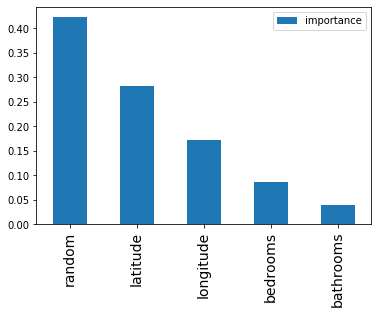

In [79]:
rf_base_importance.reset_index(drop=True).plot(kind="bar")
plt.xticks(
    ticks=range(rf_base_importance.shape[0]), 
    labels=rf_base_importance.feature,
    size=14
)
plt.show()

Забавный факт :)

Если верить встроенному методу оценки важности признаков в RandomForest, то случайный шум более важная переменная для прогнозирования стоимости арендного жилья, чем локация, количество спален или количество ванных комнат.

## Пермутированная важность

Способ вычисления важности признаков на основе усредненного уменьшения качества модели.

__Алгоритм вычисления:__

* выбираем метрику для вычислений;
* фиксируем значение метрики на валидационном наборе данных (базовое качество модели);
* для каждого признака делаем:
 * переставляем значения одного признака и применяем модель;
 * оцениваем качество модели с помощью заданной метрики;
 * важность признака оценивается разницей между базовым качество модели (качество на исходном наборе данных) и качеством после пермутации признака; 
 
__Плюсы:__
* гораздо более надежный подход к оценке важности признаков;
* не трубует повторного обучения моделей;
* работает для любой класса моделей машинного обучения;

__Минусы:__
* не позволяет оценить вклад признака в прогнозное значение модели;
* вычислительно сложнее встроенных методов оценки важности признаков;
* потенциальное смещение в пользу коррелирующих между собой признаков.

In [190]:
def calculate_permutation_feature_importance(estimator,
                                             metric,
                                             y: pd.Series,
                                             X: pd.DataFrame,
                                             fraction_sample: float = 0.15
                                             ) -> pd.DataFrame:
    """
    Функция для расчета важности переменных на основе перестановок.
    Подход к оценке важности признаков основан на изменении метрики
    при перемешивании значений данного признака. Если значение метрики
    уменьшается, значит признак важен для модели, если значение метрики
    увеличивается, то признак для модели не важен и его стоит исключить.

    Parameters:
    -----------
    estimator: sklearn.estimator
        Экземпляр модели, которая поддерживает API sklearn.
        Ожидается, что модель обучена, т.е. был вызван метод fit ранее.

    metric: func, sklearn.metrics
        Функция для оценки качества модели.

    X: pandas.DataFrame
        Матрица признаков.

    y: pandas.Series
        Вектор целевой переменной.

    fraction_sample: float, optional, default = 0.15
        Доля наблюдений от X для оценки важности признаков.

    Returns:
    --------
    X_transformed: pandas.DataFrame
        Преобразованная матрица признаков.
    """
    if fraction_sample > 1:
        raise ValueError(
            f"fraction_sample must be in range (0, 1], "
            f"but fraction_sample is {fraction_sample}")
    if isinstance(X, pd.DataFrame):
        x = X.copy()
        x, _, y, _ = train_test_split(
            x, y, train_size=fraction_sample, random_state=1)
    else:
        raise TypeError(
            f"x_valid must be pandas.core.DataFrame, "
            f"but x_valid is {type(X)}")

    feature_importance = np.zeros(x.shape[1])
    if estimator._estimator_type == "classifier":
        baseline_prediction = estimator.predict_proba(x)[:, 1]
    else:
        baseline_prediction = estimator.predict(x)
    baseline_score = metric(y, baseline_prediction)

    for num, feature in tqdm(enumerate(x.columns)):
        x[feature] = np.random.permutation(x[feature])
        if estimator._estimator_type == "classifier":
            score = metric(y, estimator.predict_proba(x)[:, 1])
        else:
            score = metric(y, estimator.predict(x))
        feature_importance[num] = score
        x[feature] = X[feature]

    feature_importance = (baseline_score - feature_importance)
    return feature_importance

def to_frame(X: pd.DataFrame, values: np.array, prefix: str) -> pd.DataFrame:
    """
    Функция для создания датафрейма с отранжированными значениями.

    Parameters:
    -----------
    X: pandas.DataFrame
        Матрица признаков.

    values: numpy.array
        Вектор с оценками важности признаков.

    prefix: string
        Префикс для колонки importance.

    Returns:
    --------
    df: pandas.DataFrame
        Датафрейм с отранжированными значениями.

    """
    df = pd.DataFrame({
        "feature": X.columns,
        f"{prefix}_importance": values
    })
    df = df.sort_values(by=f"{prefix}_importance", ascending=False)
    df = df.reset_index(drop=True)
    return df

In [192]:
permutation_importance_rf = calculate_permutation_feature_importance(
    estimator=rent_model_regressor,
    metric=mean_absolute_error,
    y=y_rent_valid,
    X=X_rent_valid
)

permutation_importance_rf = to_frame(
    X_rent_valid, permutation_importance_rf, "permutation"
)

permutation_importance_rf

5it [00:00,  9.17it/s]


,feature,permutation_importance
0,random,-248.697351
1,bathrooms,-632.445626
2,bedrooms,-642.606892
3,latitude,-865.994252
4,longitude,-943.290351


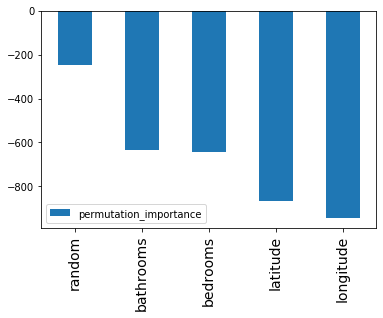

In [195]:
permutation_importance_rf.reset_index(drop=True).plot(kind="bar")
plt.xticks(
    ticks=range(permutation_importance_rf.shape[0]), 
    labels=permutation_importance_rf.feature,
    size=14
)
plt.show()

Справедливость восторжествовала! :)

Как и ожидалось, востребованность недвижимости в первую очередь определяет локация, а затем размер объекта.

## Важность на основе удаленного признака

Пермутированная важность не требует повторного обучения модели для того, чтобы измерить влияние эффекта перемешивания переменных на общее качество модели. Так как обучение модели - очень затратная операция с точки зрения потраченного времени, мы получаем большой выигрыш в производительности, но принимаем на себя риск, связанный с потенциальным смещением в пользу коррелирующих между собой признаков.

Если мы можем проигнорировать стоимость обучения модели - то лучшим вариантом для оценки важности признаков является подход на основе удаленного признака. 

__Алгорит вычисления:__

* выбрать метрику для вычислений;
* фиксируем значение метрики на валидационном наборе данных (базовое качество модели);
* для каждого признака делаем:
 * удаляем признак из обучающего набора данных и обучаем модель;
 * оцениваем качество модели с помощью заданной метрики;
 * важность признака оценивается разницей между базовым качество модели (качество на исходном наборе данных) и 
качеством после удаления признака;

Значения важности признаков, полученных с помощью пермутированной важности и важности, основанной на удалении признаков, должны давать схожие результаты, порядок ранжирования признаков должен совпадать.

In [266]:
def calculate_dropcol_feature_importance(estimator,
                                         metric,
                                         y: pd.Series,
                                         X: pd.DataFrame,
                                         fraction_sample: float = 0.15
                                         ) -> pd.DataFrame:
    """
    Функция для расчета важности переменных на основе удаления признака.
    Подход к оценке важности признаков основан на изменении метрики
    при удалении признака из выборки и обучении модели на измененном
    наборе данных. 

    Parameters:
    -----------
    estimator: sklearn.estimator
        Экземпляр модели, которая поддерживает API sklearn.

    metric: func, sklearn.metrics
        Функция для оценки качества модели.

    X: pandas.DataFrame
        Матрица признаков.

    y: pandas.Series
        Вектор целевой переменной.

    fraction_sample: float, optional, default = 0.15
        Доля наблюдений от X для оценки важности признаков.

    Returns:
    --------
    X_transformed: pandas.DataFrame
        Преобразованная матрица признаков.
    """
    if fraction_sample > 1:
        raise ValueError(
            f"fraction_sample must be in range (0, 1], "
            f"but fraction_sample is {fraction_sample}")
    if isinstance(X, pd.DataFrame):
        x = X.copy()
        x, _, y, _ = train_test_split(
            x, y, train_size=fraction_sample, random_state=1)
    else:
        raise TypeError(
            f"x_valid must be pandas.core.DataFrame, "
            f"but x_valid is {type(X)}")

    estimator.fit(x, y)
    feature_importance = np.zeros(x.shape[1])
    if estimator._estimator_type == "classifier":
        baseline_prediction = estimator.predict_proba(x)[:, 1]
    else:
        baseline_prediction = estimator.predict(x)
    baseline_score = metric(y, baseline_prediction)

    for num, feature in tqdm(enumerate(x.columns)):

        x_dropped_feature = x.drop(feature, axis=1)
        estimator.fit(x_dropped_feature.fillna(-9999), y)

        if estimator._estimator_type == "classifier":
            score = metric(
                y, estimator.predict_proba(x_dropped_feature.fillna(-9999))[:, 1]
            )
        else:                         
            score = metric(y, estimator.predict(x_dropped_feature.fillna(-9999)))
        feature_importance[num] = score

    feature_importance = (baseline_score - feature_importance)
    return feature_importance

In [260]:
dropcol_importance_rf = calculate_permutation_feature_importance(
    estimator=rent_model_regressor,
    metric=mean_absolute_error,
    y=y_rent_valid,
    X=X_rent_valid
)

dropcol_importance_rf = to_frame(
    X_rent_valid, dropcol_importance_rf, "dropcol"
)

dropcol_importance_rf

5it [00:00,  9.27it/s]


,feature,dropcol_importance
0,random,-140.367288
1,bathrooms,-630.489000
2,bedrooms,-664.745351
3,latitude,-869.189698
4,longitude,-922.432667


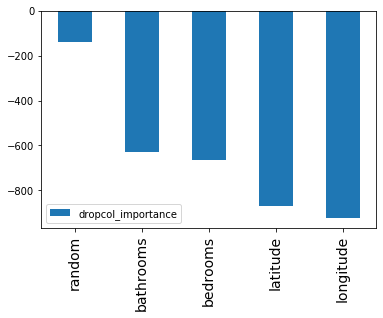

In [261]:
dropcol_importance_rf.reset_index(drop=True).plot(kind="bar")
plt.xticks(
    ticks=range(dropcol_importance_rf.shape[0]), 
    labels=dropcol_importance_rf.feature,
    size=14
)
plt.show()

In [256]:
permutation_importance_rf = calculate_permutation_feature_importance(
    estimator=rf_model,
    metric=roc_auc_score,
    X=X_valid.fillna(-9999),
    y=y_valid,
)

permutation_importance_rf = to_frame(
    X_valid, permutation_importance_rf, "perm"
)

65it [00:07,  8.74it/s]


In [257]:
permutation_importance_rf.head(n=10)

,feature,perm_importance
0,EXT_SOURCE_3,0.071530
1,EXT_SOURCE_2,0.051200
2,EXT_SOURCE_1,0.014588
3,AMT_GOODS_PRICE,0.005995
4,AMT_ANNUITY,0.003570
5,DAYS_REGISTRATION,0.003369
6,AMT_CREDIT,0.003257
7,DAYS_LAST_PHONE_CHANGE,0.002839
8,BASEMENTAREA_MEDI,0.002026
9,YEARS_BEGINEXPLUATATION_MODE,0.001152


In [267]:
dropcol_importance_rf = calculate_dropcol_feature_importance(
    estimator=rf_model,
    metric=roc_auc_score,
    X=X_valid.fillna(-9999),
    y=y_valid,
)

dropcol_importance_rf = to_frame(
    X_valid, dropcol_importance_rf, "dropcol"
)

dropcol_importance_rf.head(n=10)

65it [00:36,  1.78it/s]


,feature,dropcol_importance
0,EXT_SOURCE_1,0.008329
1,AMT_GOODS_PRICE,0.005511
2,EXT_SOURCE_3,0.005150
3,AMT_ANNUITY,0.002806
4,LANDAREA_MODE,0.001220
5,CNT_FAM_MEMBERS,0.000585
6,NONLIVINGAREA_MODE,0.000542
7,EXT_SOURCE_2,0.000501
8,BASEMENTAREA_MEDI,0.000399
9,DAYS_REGISTRATION,0.000350


## Декомпозиция прогнозов случайного леса с помощью treeinterpreter

Часто говорят, что интерпретация случайного леса затруднительна, поскольку случайные леса обычно рассматриваются как "черный ящик". Действительно, лес состоит из большого количества глубоких деревьев, где каждое дерево обучается на бутстреп-выборках, используя случайный отбор признаков для каждого дерева, поэтому полностью представить процесс принятия решения путем изучения каждого отдельного дерева невозможно. При этом, если мы рассмотрим только одно дерево, интерпретация возможна только в том случае, если дерево имеет небольшую глубину и небольшое число признаков. При глубине 10 - дерево может иметь тысячи узлов, и проинтепретировать его практически невозможно.

При рассмотрении дерева решений понятно, что для каждого решения, принимаего деревом, имеется путь от корня дерева к листьям. Путь состоит из серии решений, полученных с помощью конкретного признака, каждый из которых вносит свой вклад в итоговый прогноз. 

<img src="src/treeinter.png" width="500" height="500">

__Прогноз:__ 33.58 = 22.6 (среднее значение целевой переменной в выборке) + 14.82 (прирост среднего значения до 37.42 из-за разбиения по признаку RM) - 5.12 (снижение среднего значения до 32.2 в результат разбиения по признаку RM) + 1.28 (прирост среднего значения до 33.58 в результате разбиения по признаку NOX).

In [115]:
observation_idx = 59303
observation = X_valid.loc[[observation_idx], :]

y_valid_pred = rf_model.predict_proba(X_valid.fillna(-9999))
observation_pred = y_valid_pred[observation_idx, 1]

print(f"Прогноз для наблюдения: {round(observation_pred, 4)}")

Прогноз для наблюдения: 0.2441


Осуществляем декомпозицию прогноза для выбранного наблюдения, раскладывая значения на смещение и вклад признаков.

In [239]:
prediction, bias, contributions = ti.predict(rf_model, observation.fillna(-9999))

In [240]:
feature_contributions_df = pd.DataFrame({
    "feature": X_valid.columns,
    "feature_value": X_valid.loc[observation_idx].values,
    "contribution": contributions[0][:, 1]
})

feature_contributions_df = feature_contributions_df.sort_values(
    by="contribution", ascending=False
)
feature_contributions_df = feature_contributions_df.reset_index(drop=True)

In [241]:
# топ-10 признаков, которые вносят положительный вклад в прогноз
feature_contributions_df.head(n=10)

,feature,feature_value,contribution
0,EXT_SOURCE_2,0.094765,0.065736
1,EXT_SOURCE_3,NaN,0.020008
2,AMT_GOODS_PRICE,450000.000000,0.010740
3,EXT_SOURCE_1,NaN,0.008368
4,DEF_30_CNT_SOCIAL_CIRCLE,1.000000,0.008325
5,AMT_CREDIT,545040.000000,0.006975
6,DEF_60_CNT_SOCIAL_CIRCLE,1.000000,0.006027
7,AMT_ANNUITY,26640.000000,0.005817
8,DAYS_REGISTRATION,-287.000000,0.005580
9,DAYS_LAST_PHONE_CHANGE,-102.000000,0.004342


In [142]:
feature_contributions_df.tail(n=10)

,feature,feature_value,contribution
55,NONLIVINGAREA_MODE,NaN,-0.000018
56,LIVINGAPARTMENTS_AVG,NaN,-0.000027
57,NONLIVINGAREA_MEDI,NaN,-0.000036
58,COMMONAREA_MEDI,NaN,-0.000043
59,YEARS_BEGINEXPLUATATION_MODE,NaN,-0.000048
60,YEARS_BUILD_AVG,NaN,-0.000112
61,YEARS_BUILD_MEDI,NaN,-0.000137
62,ELEVATORS_AVG,NaN,-0.000140
63,CNT_FAM_MEMBERS,2.0,-0.000232
64,OWN_CAR_AGE,1.0,-0.002251


In [138]:
feature_contributions_df["contribution"].sum() + bias[0, 1]

0.24409082722108516

## Градиентный бустинг над решающими деревьями

In [5]:
params = {
    "max_depth": 5,
    "n_estimators": 150,
    "n_jobs": 6,
    "gamma": 5,
    "seed": 27
}

model = xgb.XGBClassifier(**params)
model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=5,
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=None, n_estimators=150, n_jobs=6,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=27,
              silent=None, subsample=1, verbosity=1)

## Встроенная в модель оценка важности признаков 

Самый простой способ понять наиболее важные признаки - это использовать встроенный в модель метод оценки важности признаков. 

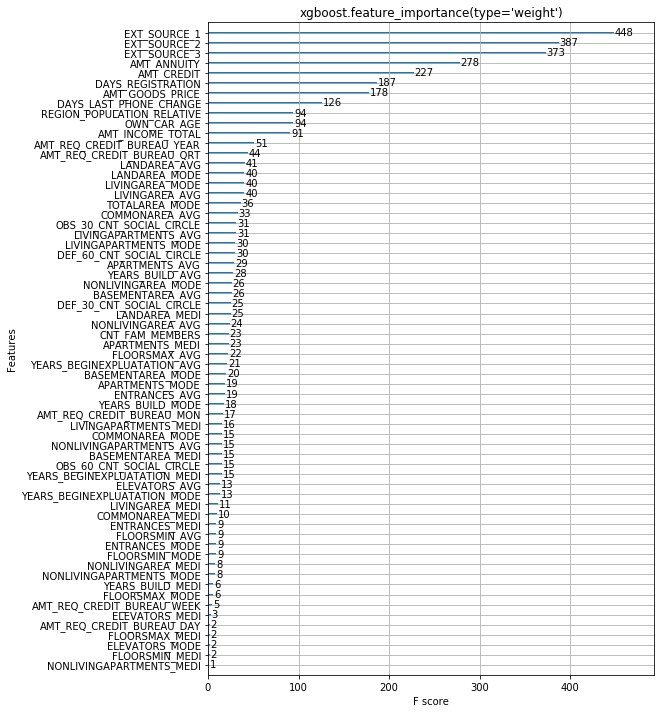

In [298]:
fig, ax = plt.subplots(1, 1, figsize=(8, 12))
xgb.plot_importance(model, ax=ax, title="xgboost.feature_importance(type='weight')")

Отлично, мы видим, что признак, основанный на внешнем скоринге (EXT_SOURCE_1), явно преобладает над другими признаками, выделяясь в качестве наиболее важных предикторов дефолта. Мы могли бы принять эту гипотезу и сообщить нашему менеджеру, что нужно покупать как можно больше данных у внешних поставщиков.

Однако, в XGBoost есть несколько способов оценить важность признаков:

* __Weight__ - количество разбиений в дереве, в которых используется признак;

* __Cover__ - количество разбиений в дереве, в которых используется признак, взвешенное на количество объектов обучающей выборки, которые участвовали в разбиении;

* __Gain__ - среднее уменьшениее значения функции потерь, полученное при использовании данного разбиения.

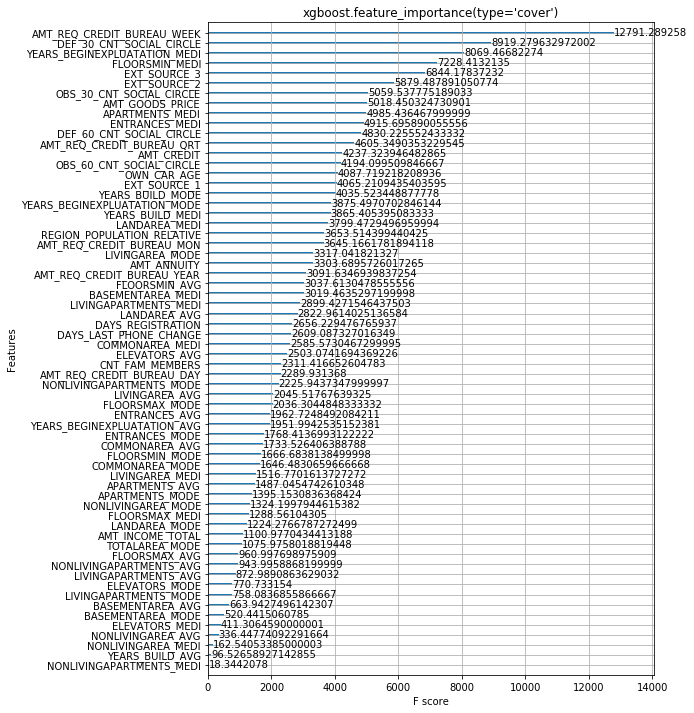

In [299]:
fig, ax = plt.subplots(1, 1, figsize=(8, 12))
xgb.plot_importance(
    model, 
    importance_type="cover", 
    title="xgboost.feature_importance(type='cover')",
    ax=ax)

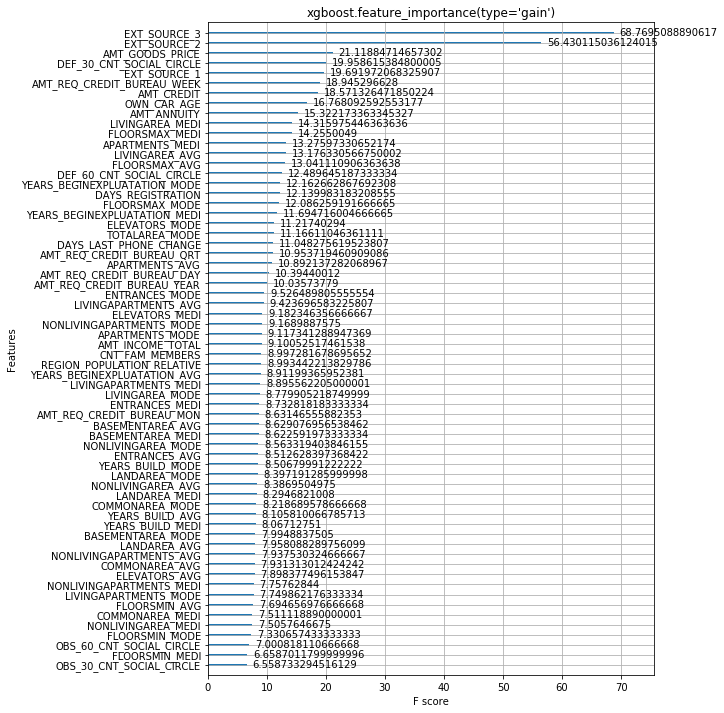

In [300]:
fig, ax = plt.subplots(1, 1, figsize=(8, 12))
xgb.plot_importance(
    model, 
    importance_type="gain", 
    title="xgboost.feature_importance(type='gain')",
    ax=ax)

## Почему это не работает - более наглядный пример

In [201]:
feature_a = [
    0, 0, 0, 0, 1, 1, 1, 1
]
feature_b = [
    0, 0, 1, 1, 0, 0, 1, 1
]
feature_y = [
    0, 0, 0, 0, 0, 0, 1, 1
]

df = pd.DataFrame({
    "a": feature_a,
    "b": feature_b,
    "y": feature_y
})

df

,a,b,y
0,0,0,0
1,0,0,0
2,0,1,0
3,0,1,0
4,1,0,0
5,1,0,0
6,1,1,1
7,1,1,1


In [202]:
y_synthetics = df["y"]
X_synthetics = df.drop("y", axis=1)

model_ = xgb.XGBClassifier(max_depth=2, n_estimators=10)
model_.fit(X_synthetics, y_synthetics)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=2,
              min_child_weight=1, missing=None, n_estimators=10, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [203]:
model_.feature_importances_

array([1., 0.], dtype=float32)

В данном случае мы видим, что признак A и B абсолютно равноправны с точки зрения y, однако стандартный feature_importances в XGBoost говорит обратное. Кроме того, мы не можем понять какой характер зависимости целевой переменной y от значений признака A и какой вклад в итоговый прогноз модели вносит признак A.

## Описание Shap

В Shap для оценки важности признаков рассчитываются значения Шэпли.

Для оценки важности признаков происходит оценка предсказаний модели с использование данного признака и без признака. Расчет важности признаков основан на подходах из теории игр. 

Делается ряд предположений:

* сумма вознаграждений каждого игрока равна общей сумме призового фонда;
* если два игрока сделали одинаковый вклад в игру, их вознаграждение одинаково;
* если игрок сделал нулевой вклад в игру, то его вознаграждение равно нулю;
* если игрок провел несколько игр, то его суммарное вознаграждение состоит из суммы вознаграждений за каждую игру.

Более подробно теоритическая часть подхода описана:

https://towardsdatascience.com/interpreting-your-deep-learning-model-by-shap-e69be2b47893

## Вычисление SHAP values

In [200]:
explainer = shap.TreeExplainer(model)
expected_value = explainer.expected_value

if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")
print(f"Mean-target: {np.mean(y_valid)}")

select = range(1000)
features = X_valid.iloc[select]
features_display = X_valid.loc[features.index]

Explainer expected value: -2.482765889480106
Mean-target: 0.08093957985561602


In [6]:
%%time
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)
    shap_interaction_values = explainer.shap_interaction_values(features)

if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

CPU times: user 1min 11s, sys: 237 ms, total: 1min 11s
Wall time: 1min 11s


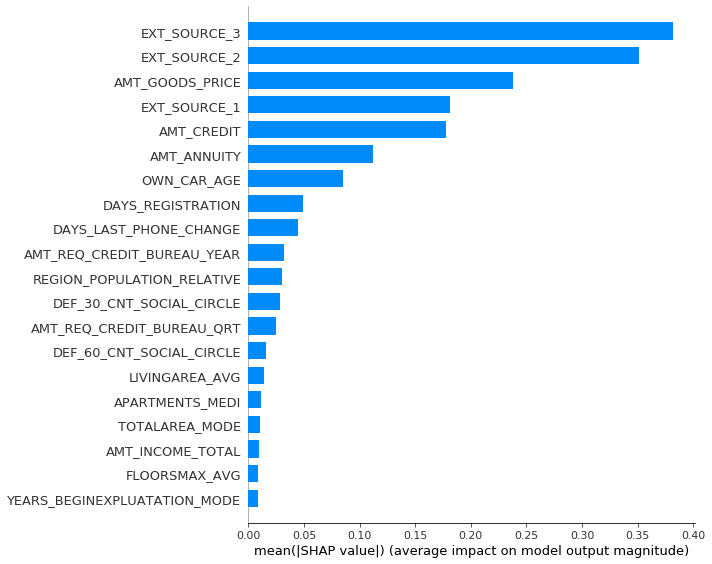

In [205]:
shap.summary_plot(shap_values, features=X_valid, plot_type="bar")

### ok, EXT_SOURCE_3 - самый важный признак, а как он связан с дефолтом?

## Рассмотрим на конкретном объекте

In [226]:
shap.force_plot(
    explainer.expected_value, shap_values[758, :], X_valid.loc[758, :], link="logit")

In [225]:
shap.force_plot(
    explainer.expected_value, shap_values[0, :], X_valid.loc[0, :], link="logit")

## Feature Importance по наблюдениям

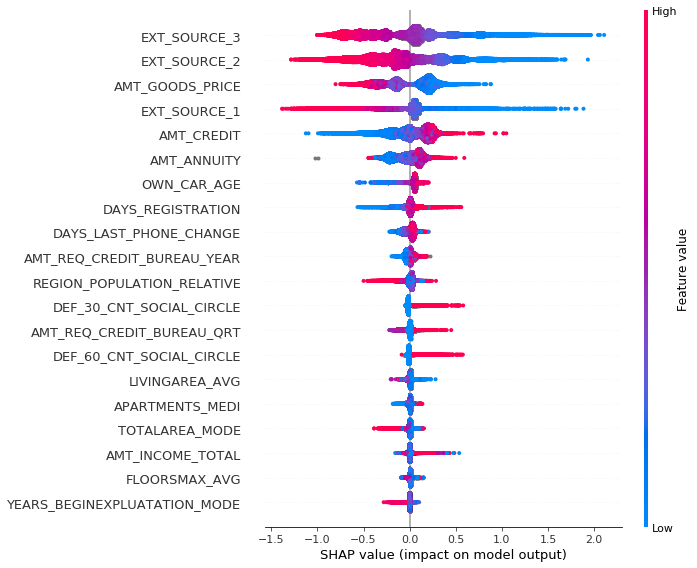

In [209]:
shap.summary_plot(shap_values, X_valid)

## Decision Plot

* по горизонтальной оси отложен прогноз модели, представленный в виде log-odds;
* shap-values позволяют разложить вклад признака в итоговый прогноз модели по аналогии с линейными моделями;
* по вертикальной оси представлены признаки модели; по умолчанию, признаки упорядочены по убыванию важности для анализируемых объектов, а не для всей выборки.
* каждый прогноз представлен цветной линией, цвет линии зависит от значения прогноза;
* при перемещении от нижней части графика к верхней части SHAP-values для каждого признака добавляются к базовому прогнозу. Таким образом, мы можем отслеживать какой вклад вносит в прогноз каждый признак в отдельности;

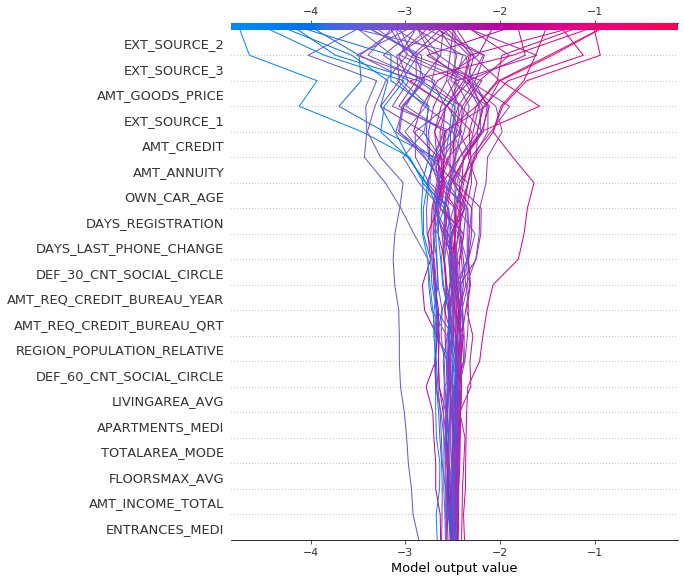

In [34]:
shap.decision_plot(expected_value, shap_values[:50, :], features_display)

Как и force-plot, график decision-plot поддерживает link = 'logit' для преобразования логарифма отношения шансов к вероятности

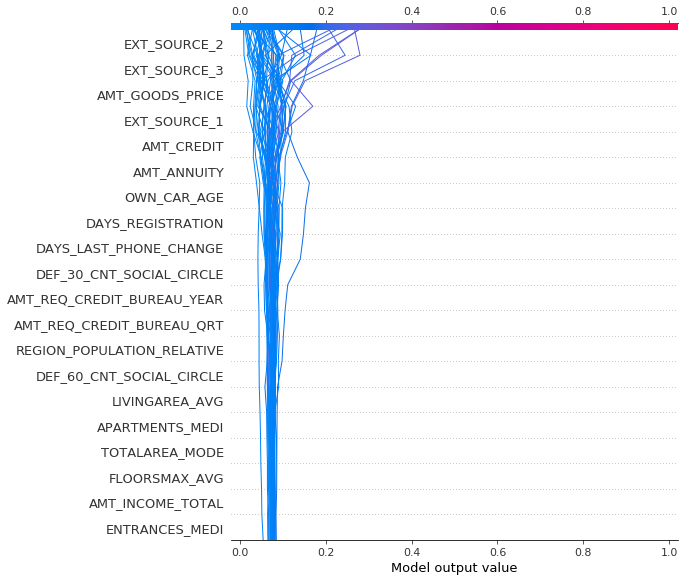

In [27]:
shap.decision_plot(expected_value, shap_values[:50, :], features_display, link="logit")

Особо важные наблюдения могут быть выделены с использованием пунктирной линии. Например, мы можем выделить пунктирной линией неправильно классифицированное наблюдение.

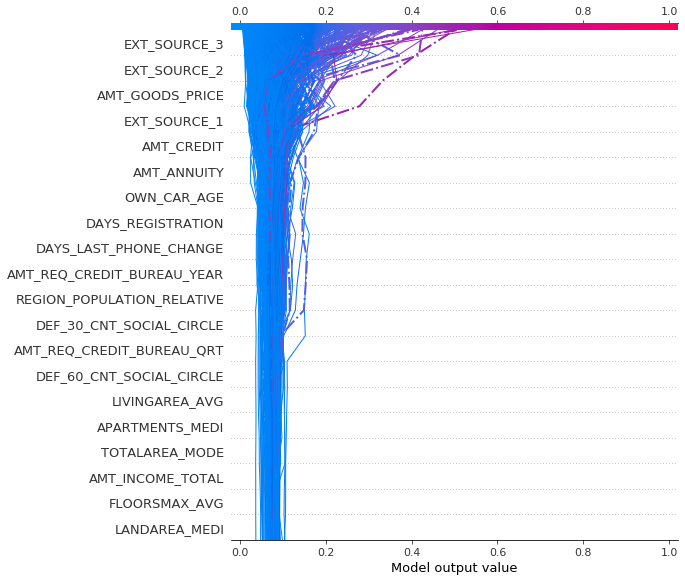

In [40]:
# используем порог 0.5
y_pred = model.predict(X_valid)[:1000] > 0
misclassified = y_pred != y_valid[list(select)]

shap.decision_plot(expected_value, shap_values, features_display, link='logit', highlight=misclassified)

Хорошо, давайте происследуем неверно классифицированное наблюдение, рассмотрим это наблюдение отдельно.

Когда мы работает с одним наблюдением, то на вертикальной оси признаки отранжированы в соответствии с кладом данного признака в прогноз на данном объекте, то есть признаки отранжированы не по всей выборке, а по данному наблюдению. 

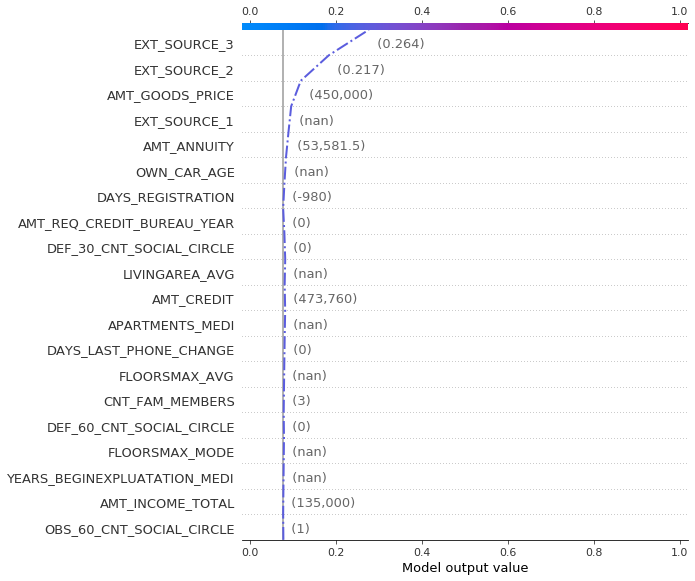

In [82]:
shap.decision_plot(
    expected_value, 
    shap_values[misclassified][2, :], 
    features_display[misclassified].iloc[2],
    link='logit', highlight=0
)

force-plot для неправильно классифицированного наблюдения приведен ниже. 
В этом случае decision-plot и force-plot эффективны для демонстрации того, как модель пришла к своему решению.

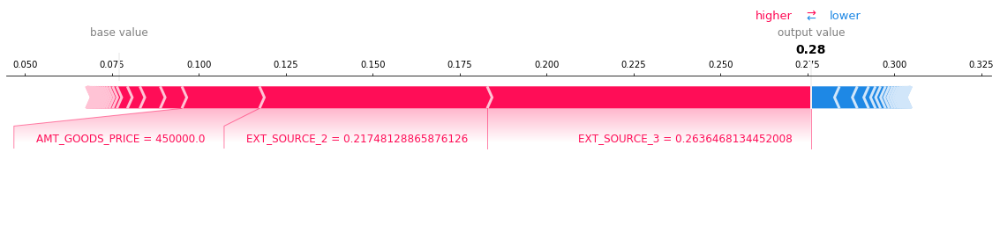

In [83]:
shap.force_plot(
    expected_value, 
    shap_values[misclassified][2, :], 
    features_display[misclassified].iloc[2], 
    matplotlib=True,
    link='logit'
)

## Когда использовать Decision plot?

* хотим посмотреть вклад многих признаков (в пределе - всех признаков);
* визуализация прогнозов для разных классов для задачи многоклассовой классификации;
* визуализировать эффект от взаимодействия признаков;
* обнаружить выбросы;
* обнаружить типичные пути прогнозирования;
* сравнить и сопоставить прогнозы для нескольких моделей.

## Визуализация воздействия многих признаков на прогноз

Как и force-plot, decision-plot показывает признаки, которые вносят наибольший вклад в прогнозное значение. Однако decision-plot может быть более полезным, чем force-plot, когда задействовано большое количество важных признаков. Два графика и force-plot, и decision-plot используются для решений одной задачи. Горизонательно-ориентированный формат force-plot не позволяет ему четко показывать все важные признаки. И наоборот, вертикально-ориентированный формат decision-plotможет отображать воздействия любого количества признаков.

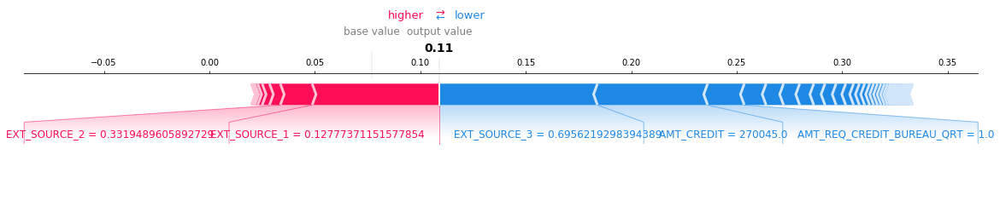

In [90]:
shap.force_plot(
    expected_value, 
    shap_values[388, :], 
    features_display.loc[388], 
    matplotlib=True,
    link='logit'
)

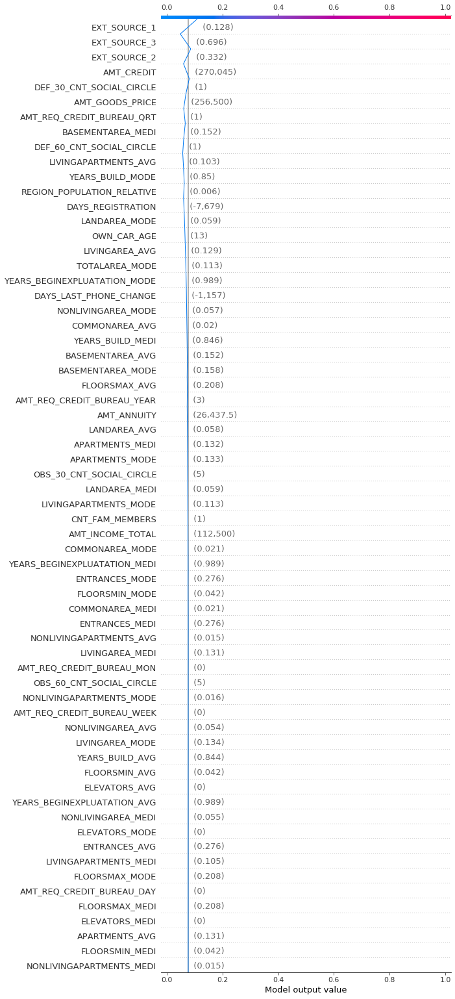

In [94]:
shap.decision_plot(
    expected_value, 
    shap_values[388, :], 
    features_display.loc[388], 
    feature_display_range=slice(None, -X_valid.shape[1], -1),
    link='logit'
)

## Визуализация эффекта от взаимодействия признаков

Графики decision-plot поддерживают взаимодействие признаков.

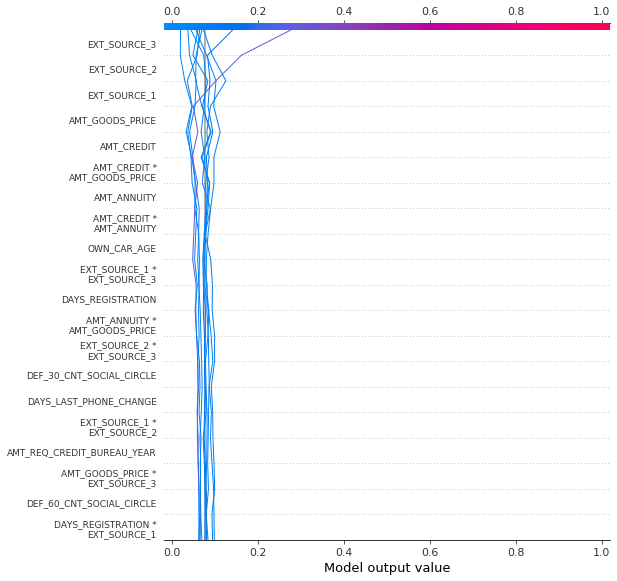

In [97]:
shap.decision_plot(
    expected_value, 
    shap_interaction_values[:10], 
    features_display.loc[:10],
    link='logit')

## Изменение предсказаний модели от при изменении значения признака

decision-plot может показать, как предсказания модели меняются в зависимости от заданного набора признаков.

In [104]:
idx = 25
features_display.loc[idx]

AMT_INCOME_TOTAL              157500.000000
AMT_CREDIT                    452385.000000
AMT_ANNUITY                    22131.000000
AMT_GOODS_PRICE               373500.000000
REGION_POPULATION_RELATIVE         0.020246
                                  ...      
AMT_REQ_CREDIT_BUREAU_DAY          0.000000
AMT_REQ_CREDIT_BUREAU_WEEK         0.000000
AMT_REQ_CREDIT_BUREAU_MON          1.000000
AMT_REQ_CREDIT_BUREAU_QRT          0.000000
AMT_REQ_CREDIT_BUREAU_YEAR         1.000000
Name: 25, Length: 65, dtype: float64

Создадим синтетический набор данных, используя копию наблюдения. Изменим вероятность дефолта, полученную от внешнего поставщика 3, в диапазоне от 0 до 1 с шагом 0.05 и получим соответствующие значения SHAP.

In [154]:
rg = np.arange(0, 1.01, 0.05)
R = features_display.iloc[np.repeat(idx, len(rg))].reset_index(drop=True)
R['EXT_SOURCE_3'] = rg 

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    hypothetical_shap_values = explainer.shap_values(R)
    
hypothetical_predictions = expected_value + hypothetical_shap_values.sum()
hypothetical_predictions = 1 / (1 + np.exp(-hypothetical_predictions))

Этот график показывает изменение shap-value в диапазоне значений признака. shap-value для этой модели представляют собой изменение log-odds. Этот график показывает, что shap-values значительно изменились в пределах до 100000 и после 400000.

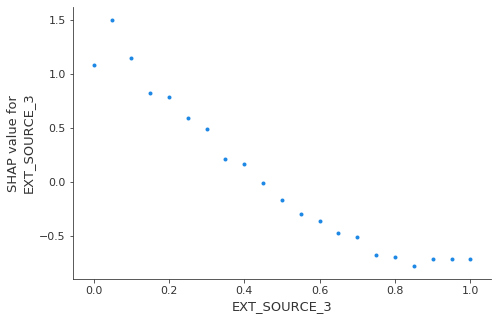

In [155]:
shap.dependence_plot('EXT_SOURCE_3', hypothetical_shap_values, R, interaction_index=None)

Text(0, 0.5, 'probability of default')

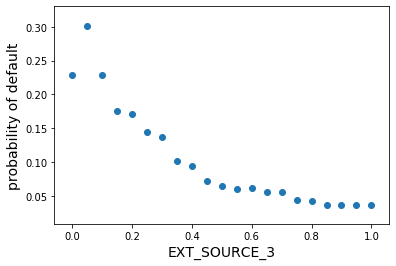

In [156]:
r_pred = model.predict_proba(R)[:, 1]
plt.scatter(rg, r_pred)
plt.xlabel("EXT_SOURCE_3", size=14)
plt.ylabel("probability of default", size=14)

График dependence-plot полезен, но по нему сложно определить как изменится прогноз при изменении значения принзака. Для понимая как изменится прогноз в зависимости от значения признака построим несколько кривых в decision-plot. 

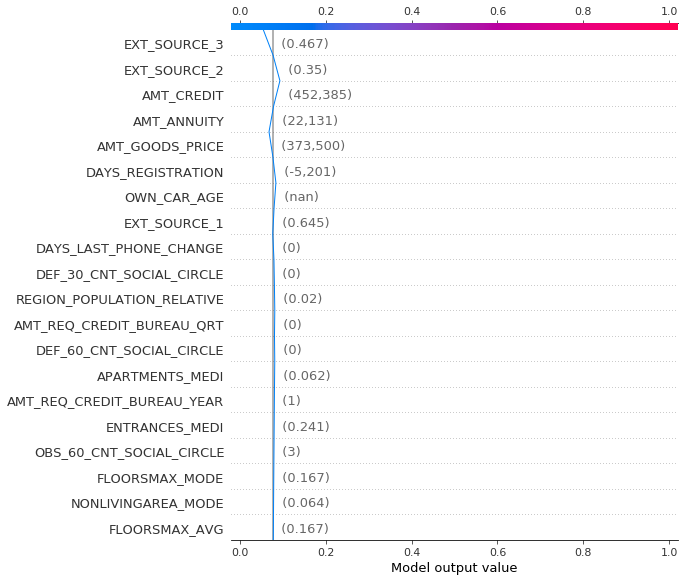

In [157]:
# прогнох модели на заданном наборе признаков

shap.decision_plot(
    expected_value, 
    shap_values[0], 
    features_display.iloc[idx],  
    link='logit')

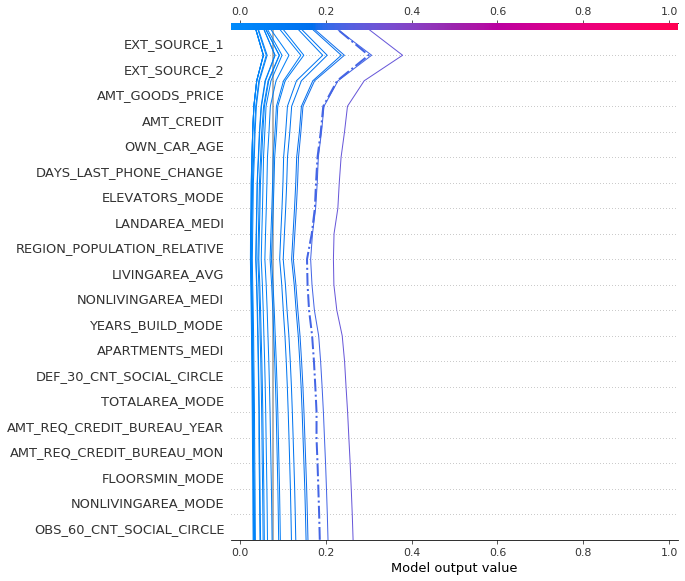

In [163]:
shap.decision_plot(
    expected_value, 
    hypothetical_shap_values, 
    R, 
    link='logit', 
    feature_order='hclust', 
    highlight=0)

## Определение выбросов

Графики decision-plot могут помочь обнаружить выбросы в данных. Если указать feature_order = 'hclust', то будут сгруппированы кривые с похожими путями прогнозирования. Это помогает облегчить выявление аномалий. При построении выбросов, лучше оставить выход модели в лог-масштабе. 

На графике ниже показаны все прогнозы в диапазоне вероятностей [0,03, 0,1]. (Прогнозы менее 0,03 исключаются в этом примере, поскольку они представляют большое количество наблюдений.) Два прогноза сразу выделяются. Эффекты «Age», «Capital Loss» и «Capital Gain» наиболее заметны.
Opredelit' vybrosy

In [225]:
y_pred = model.predict_proba(X_valid)[:, 1]  # Get predictions on the probability scale.
T = X_valid[(y_pred >= 0.01) & (y_pred <= 0.1)].sample(1000)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

Визуализируем часть объектов, для которых прогноз модели лежит в интервале [0.01, 0.1]. Выделяется поведение признака EXT_SOURCE_1.

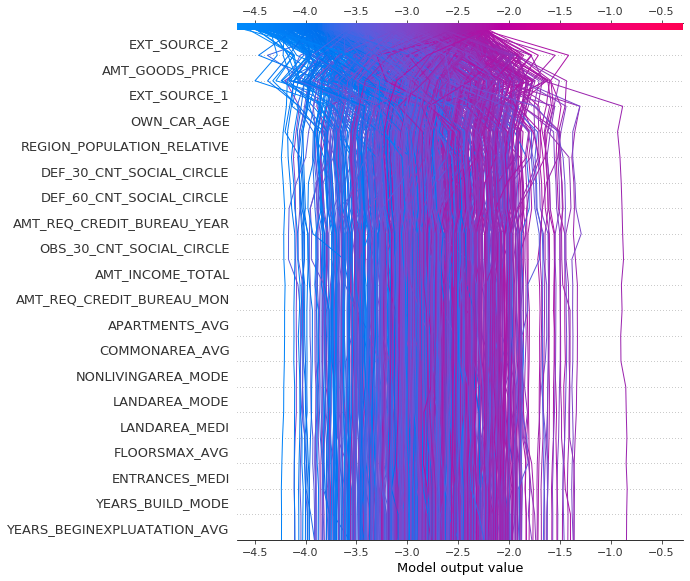

In [226]:
r = shap.decision_plot(
    expected_value, 
    sh, 
    T, 
    feature_order='hclust', 
    return_objects=True)

Найдем выбросы на основе shap-values и нанесем на график значения признаков для этих объектов.

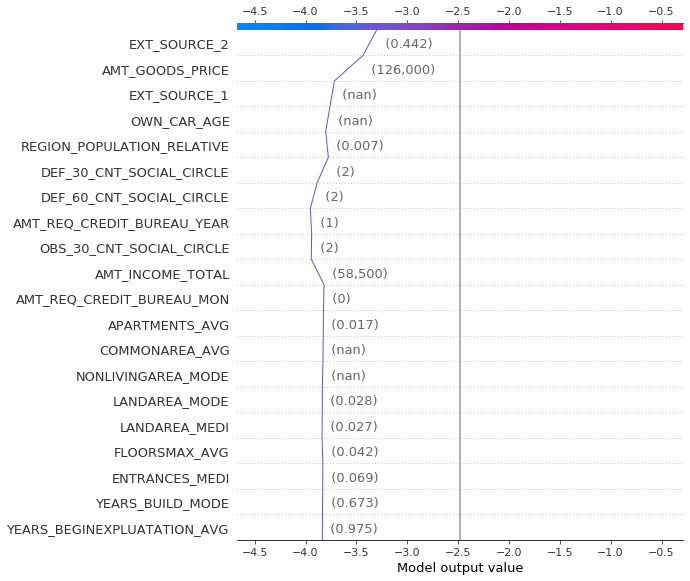

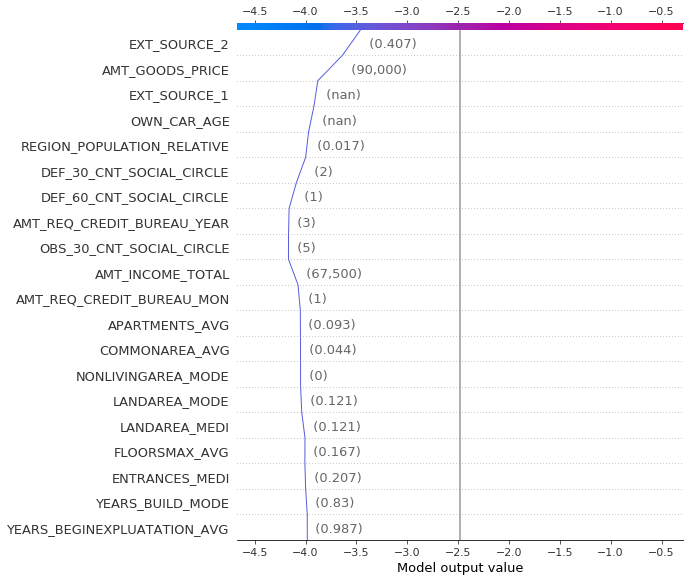

In [249]:
# Поиск наблюдения с наиболее отрицательными влиянием признака «Доход клиента».
idx = np.argpartition(sh[:, T.columns.get_loc('AMT_INCOME_TOTAL')], 2)[0:2]

for i in idx:
    shap.decision_plot(
        expected_value, 
        sh[i], 
        X_valid.loc[T.index[i]], 
        feature_order=r.feature_idx, 
        xlim=r.xlim
    )

## Типичные пути прогнозирования

decision-plot может раскрыть типичные пути прогнозирования модели. Построим все прогнозы в интервале вероятностей [0.5, 1.0], чтобы увидеть, что общего у объектов с высокой вероятностью дефолта. Мы используем упорядочение функций hclust для группировки похожих путей прогнозирования. График показывает два различных пути: 

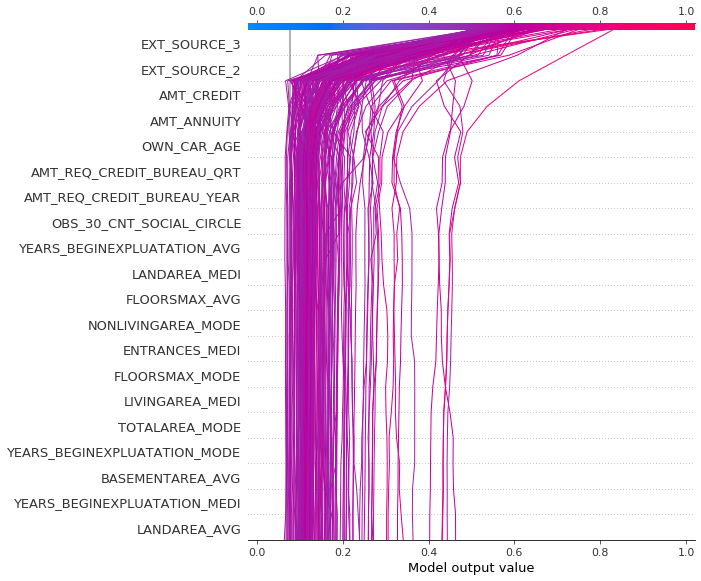

In [263]:
y_pred = model.predict_proba(X_valid)[:, 1] 
T = X_valid[y_pred >= 0.5]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

shap.decision_plot(
    expected_value, 
    sh, 
    T, 
    feature_order='hclust', 
    link='logit'
)

## Выбор признаков для отображения

Признаки, отображаемые на графике decision-plot, управляются двумя параметрами:

* feature_order - определяет порядок расположения признаков перед отображениям;
* feature_display_range - определяет какие из признаков будут отображаться; принимает в качестве аргумента либо фрагмент, либо объект диапазона. Также управляет порядок отображения признаков (в порядке возрастания или убывания);

__ПРИМЕР:__ если feature_order='importance', то decision_plot выводит признаки в порядке возрастания важности перед отображением. Если feature_display_range = slice (-1, -21, -1), на графике отображаются 20 самых важных признаков, отсортированных по убыванию. Срез (-1, -21, -1) интерпретируется как "начать с последнего признака и перейти к 21-му признаку с конца".

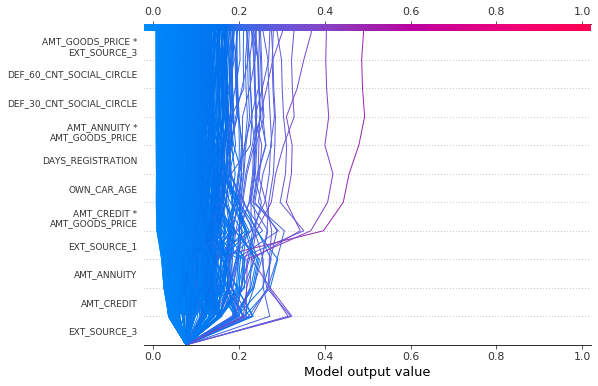

In [288]:
# Наиболее 11 признаков, отсортированных по возрастанию важности

shap.decision_plot(
    expected_value, 
    shap_interaction_values, 
    features, 
    link='logit', 
    feature_order='hclust', 
    feature_display_range=range(10, -1, -1)
)

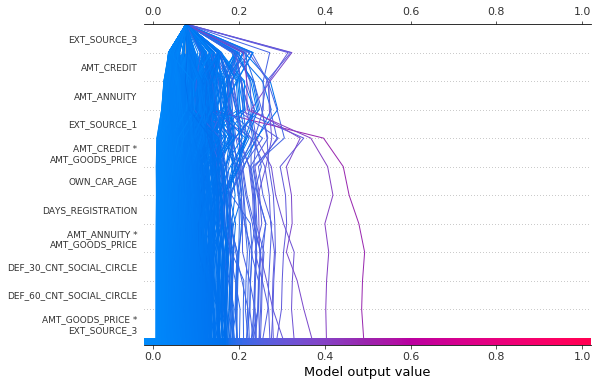

In [289]:
# то же самое, но по убыванию важности

shap.decision_plot(expected_value, 
    shap_interaction_values, 
    features, 
    link='logit', 
    feature_order='hclust', 
    feature_display_range=range(0, 11, 1)
)

Мы можем отобразить все признаки на графике с помощью feature_display_range = slice (None, None, -1). 

__Примечание__. Если датасет содержит много признаков, то будет построен __очень большой график__.

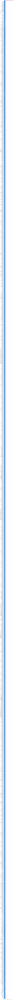

In [296]:
shap.decision_plot(
    expected_value, 
    shap_interaction_values[:100], 
    features.loc[:100], 
    link='logit', 
    feature_order='hclust', 
    feature_display_range=slice(None, None, -1),
    ignore_warnings=True
)

## Где еще можно использовать методы анализа важности признаков?

<img src="src/adversarial_validation.png" width="300" height="300">

### 1. Анализ природы артефактов

В реальных данных мы часто сталкиваемся с различными артефактами: пропусками, аномальными значениями и т.п. Очень часто необходимо уметь определять их природу: не зависит ли их присутствие от значений признаков.

<img src="src/outliers.png" width="300" height="300">

* Выбираем признак, с пропусками. Удаляем его из выборки, а целевой переменной назначаем флаг наличия пропуска (1 если пропуск есть на объекте, =0 если нет). Если такую задачу удаётся хорошо решить, то пропуски определяются значениями других признаков, по важностям можно определить каких именно.

* Если составить выборку целиком из характеристических признаков пропусков во всех признаках, то можно автоматически определить, зависит ли пропуск от факта наличия пропусков в других признаках.

Такие же приёмы можно использовать для поиска утечек (leakage) в данных (соревнования / сбор данных с утечкой). Например, в данные добавляют признак «номер строки», чтобы определить, зависит ли целевой признак от порядка объектов.

### 2. Совпадение распределений на обучении и на тесте

* Модель, обученную на определённой выборке, разумно применять на новых данных, если эти данные похожи на обучающую выборку. Проверить это можно простым способом: сделаем бинарный целевой признак, который равен 1 на объектах теста и 0 – на объектах обучения.

<img src="src/adv_sample.png" width="300" height="300">

Если такую задачу удастся хорошо решить (на банковских данных клиентов начала и конца года, бывает, что AUC ROC достигает 0.9), то значит обучение и тест не похожи. Посмотрев на важности признаков, можно понять почему.

Обычно этот приём используют в соревновательном анализе  данных для подбора части обучающей выборки, которая похожа на тест. Если получить OOF-ответы модели, то из объектов обучения, у которых большая вероятность принадлежности тесту с точки зрения построенной модели, можно составить «похожую на тест подвыборку».

In [183]:
X_adv = pd.concat([X_train, X_valid])
X_adv = X_adv.reset_index(drop=True)

y_adv = np.hstack((
    np.zeros(X_train.shape[0]),
    np.ones(X_valid.shape[0])
))

In [181]:
catboost_model = cb.CatBoostClassifier(iterations=20)
catboost_model.fit(X_adv, y_adv)

Learning rate set to 0.5
0:	learn: 0.6306530	total: 50ms	remaining: 950ms
1:	learn: 0.6156045	total: 95.6ms	remaining: 860ms
2:	learn: 0.6118788	total: 139ms	remaining: 789ms
3:	learn: 0.6109646	total: 190ms	remaining: 759ms
4:	learn: 0.6106668	total: 241ms	remaining: 723ms
5:	learn: 0.6105405	total: 282ms	remaining: 659ms
6:	learn: 0.6104531	total: 321ms	remaining: 596ms
7:	learn: 0.6103936	total: 358ms	remaining: 537ms
8:	learn: 0.6102848	total: 399ms	remaining: 488ms
9:	learn: 0.6102358	total: 464ms	remaining: 464ms
10:	learn: 0.6101581	total: 563ms	remaining: 460ms
11:	learn: 0.6100380	total: 659ms	remaining: 440ms
12:	learn: 0.6099892	total: 759ms	remaining: 409ms
13:	learn: 0.6099190	total: 835ms	remaining: 358ms
14:	learn: 0.6098484	total: 925ms	remaining: 308ms
15:	learn: 0.6097746	total: 1.02s	remaining: 255ms
16:	learn: 0.6096840	total: 1.09s	remaining: 192ms
17:	learn: 0.6095847	total: 1.13s	remaining: 126ms
18:	learn: 0.6094636	total: 1.18s	remaining: 62.3ms
19:	learn: 0.60

In [187]:
adv_validation_importance = calculate_permutation_feature_importance(
    estimator=catboost_model,
    metric=roc_auc_score,
    X=X_adv,
    y=y_adv
)

adv_validation_importance = _to_frame(
    X_adv, adv_validation_importance, "adv_validation")

65it [00:01, 33.66it/s]


In [189]:
adv_validation_importance.head(n=20)

,feature,adv_validation_importance
0,YEARS_BEGINEXPLUATATION_AVG,0.009184
1,EXT_SOURCE_2,0.008311
2,BASEMENTAREA_AVG,0.005740
3,FLOORSMAX_MODE,0.005500
4,LIVINGAREA_AVG,0.005468
5,YEARS_BEGINEXPLUATATION_MODE,0.005247
6,AMT_CREDIT,0.004680
7,BASEMENTAREA_MODE,0.004301
8,FLOORSMIN_MEDI,0.003536
9,FLOORSMIN_MODE,0.003181
